In [1]:
import cv2 #importOpenCV
from matplotlib import pyplot as plt #import mathplotlib

def get_figsize(im):
    # What size does the figure need to be in inches to fit the image?
    dpi = plt.rcParams['figure.dpi']
    dim = im.shape
    figuresize = dim[1]/float(dpi), dim[0]/float(dpi)
    return(figuresize)
def display_image_actual_size_single(im_data):
    figuresize = get_figsize(im_data)
    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figuresize)
    # Add the single axis to fit the image to the screen boundary
    ax = fig.add_axes([0, 0, 1, 1])
    ax.imshow(im_data, cmap='gray')
    ax.axis('off')
    plt.show()
    return(fig)
def display_image_actual_size_double(im_data1,im_data2):
    # assuming that the two input images have the same dimension and shape
    # then, we calculate figsize from one of the two images
    figuresize = get_figsize(im_data1)
    # Create a figure of the right size that can accommodate two images side-by-side
    fig = plt.figure(figsize=(figuresize[0],figuresize[1]*2+.1))
    ax1 = fig.add_axes([0,0,1,1])
    ax1.imshow(im_data1, cmap='gray')
    ax1.axis('off')
    ax2 = fig.add_axes([1.1,0,1,1])
    ax2.imshow(im_data2, cmap='gray')
    ax2.axis('off')
    return(fig)

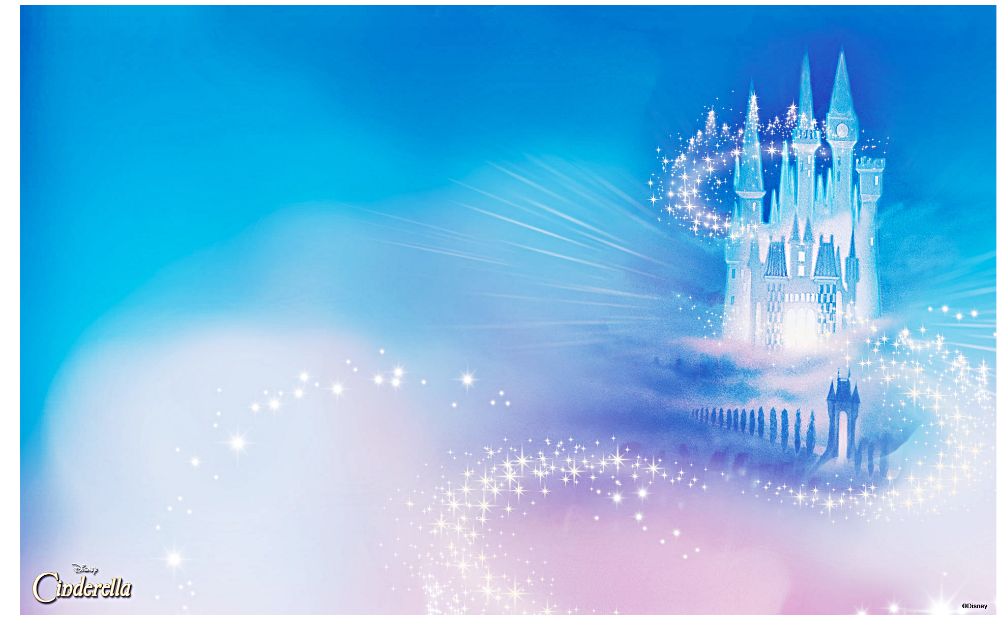

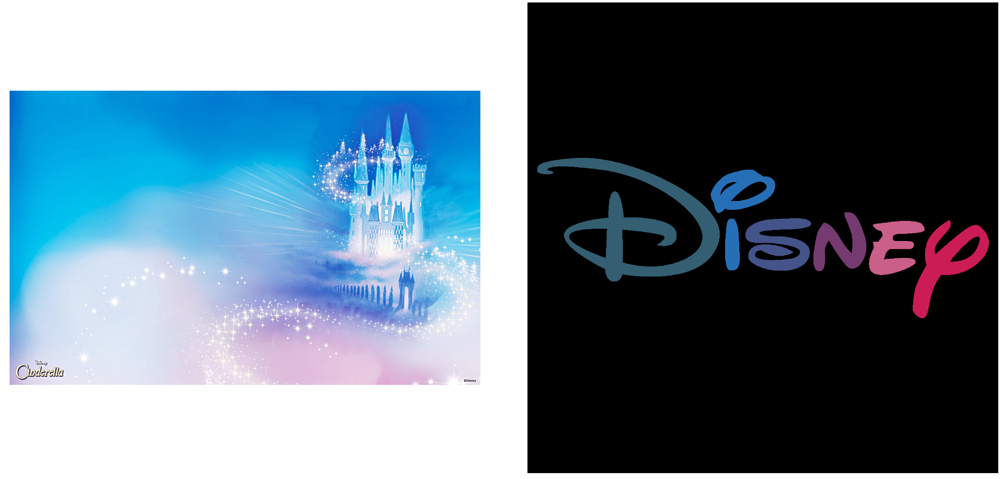

In [2]:
bgC = cv2.imread('background.jpg')
bg = cv2.cvtColor(bgC, cv2.COLOR_BGR2RGB)
logoC = cv2.imread('logo.png')
logo = cv2.cvtColor(logoC, cv2.COLOR_BGR2RGB)
fig = display_image_actual_size_single(bg)
fig = display_image_actual_size_double(bg, logo)

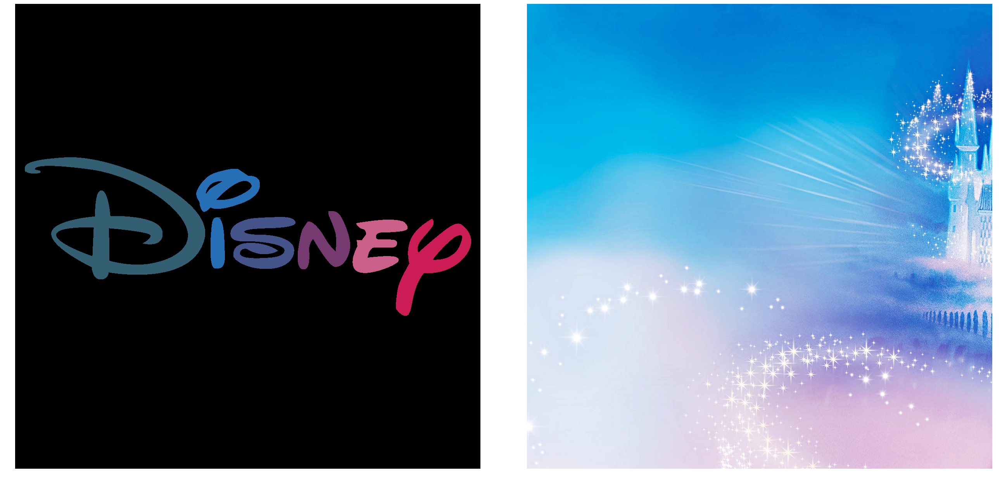

In [3]:
rows, cols, channels = logo.shape       #get the width, the height, and the channels of fg
roi = bg[0:0+rows, 300:300+cols]  #cut from bg the roi of the same dimesions as fg
show = display_image_actual_size_double(logo, roi)
show.savefig("Lab3Ex1.jpg", bbox_inches='tight')

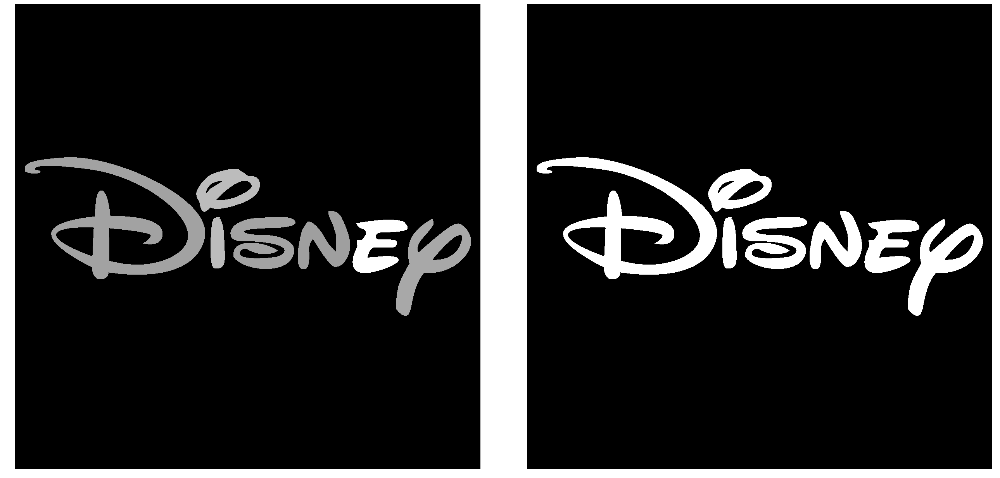

In [4]:
fgGrayscale = cv2.cvtColor(logoC, cv2.COLOR_BGR2GRAY)
thres = 30
retval, mask = cv2.threshold(fgGrayscale, thres, 255, cv2.THRESH_BINARY)
show = display_image_actual_size_double(fgGrayscale,mask)
show.savefig("Lab3Ex2.jpg", bbox_inches='tight')

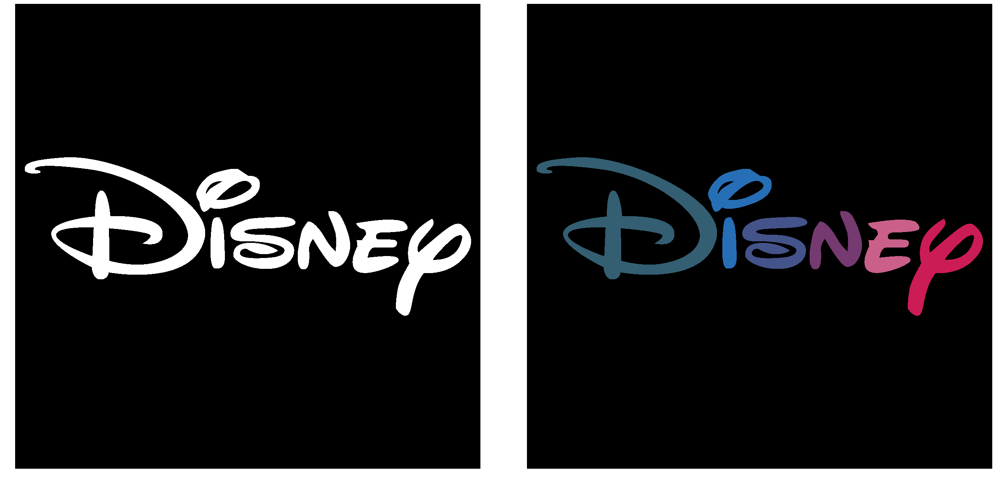

In [5]:
result = cv2.bitwise_and(logo, cv2.cvtColor(mask,cv2.COLOR_GRAY2BGR))
show = display_image_actual_size_double(mask,result)
mask = cv2.cvtColor(mask,cv2.COLOR_GRAY2BGR);
show.savefig("Lab3Ex3.jpg", bbox_inches='tight')

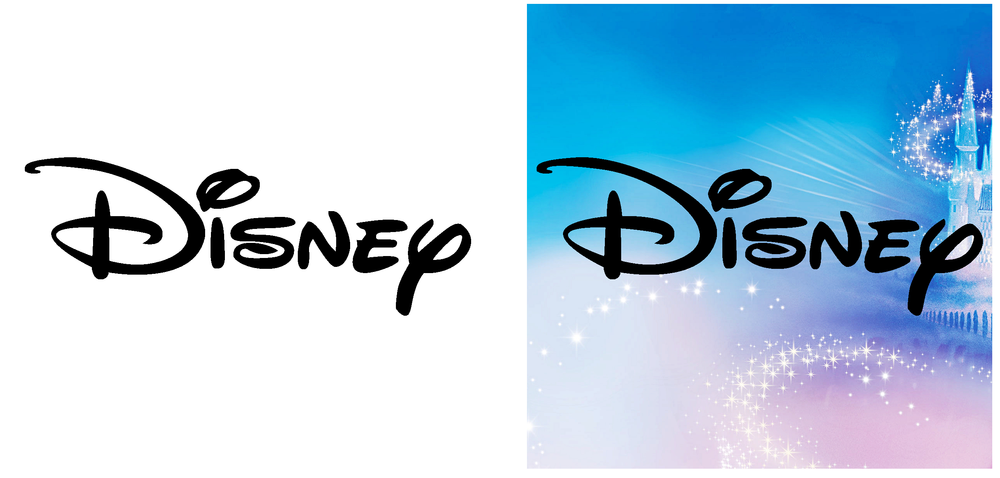

In [6]:
not_mask = cv2.bitwise_not(mask);
result2 = cv2.bitwise_and(roi,not_mask)
show = display_image_actual_size_double(not_mask,result2)
show.savefig("Lab3Ex4.jpg", bbox_inches='tight')

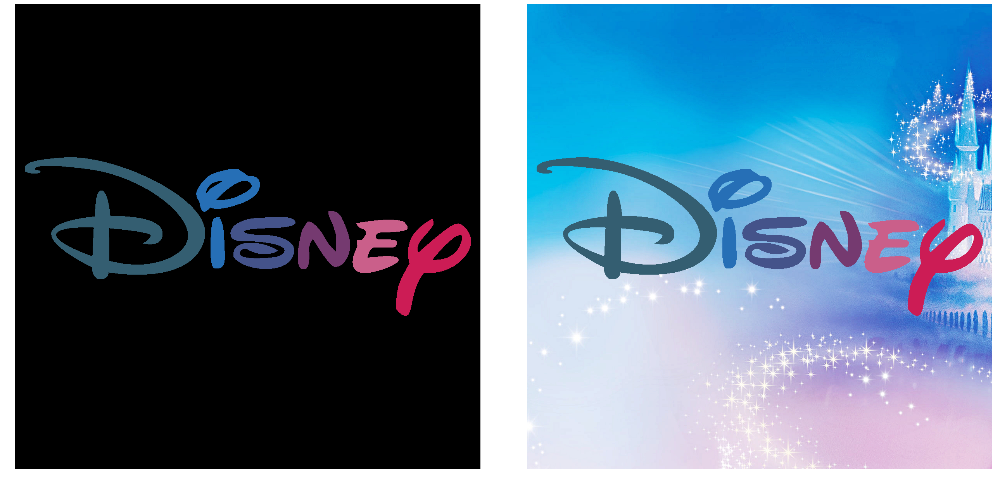

In [11]:
replace = cv2.bitwise_or(result,result2);
fig = display_image_actual_size_double(logo,replace);
fig.savefig("Lab3Ex5.jpg", bbox_inches='tight')

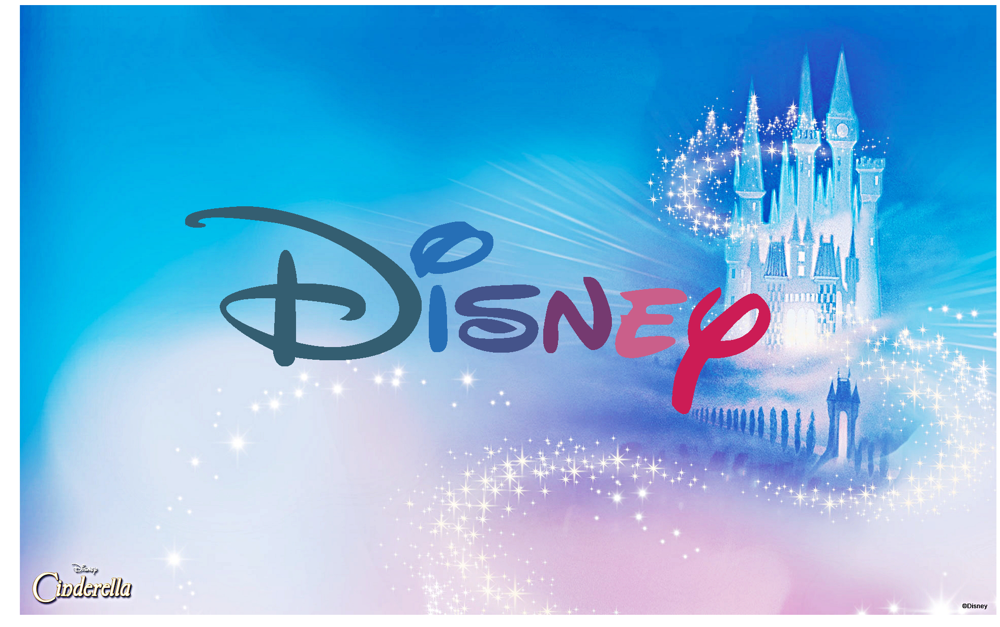

In [13]:
bg[0:0+rows, 300:300+cols] = replace
fig = display_image_actual_size_single(bg)
fig.savefig("Lab3Ex6.jpg", bbox_inches='tight')